# Sediment Core Analysis

In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
from scipy import stats
from matplotlib.backends.backend_pdf import PdfPages
from IPython.display import Image
from IPython.display import HTML

In most areas of the United States it is assummed that leaded gasoline was a major cause of lead pollution before it was banned in the 1970's.  However New York City may be a unique case and could be different.  A colleague at Lamont put out this nice article saying that incineration of municipal waste was the main cause of lead to the atmosphere in New York City and not Leaded Gasoline during the 20th century.  This was based on data collected from a sediment core.  Here is a link to the [paper](http://pubs.acs.org/doi/abs/10.1021/es9807892) and the [pdf](http://pubs.acs.org/doi/pdf/10.1021/es9807892).  See the abstract below.   This notebook is for information and you only need to read it.

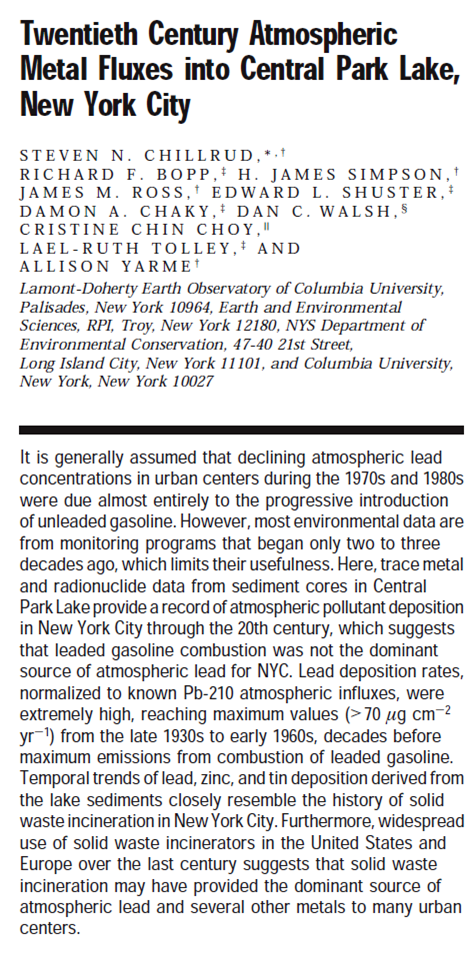

In [9]:
Image(filename='Chillrud-Abstract.png',width=300)

Here is a picture of the authors collecting the core in central park!

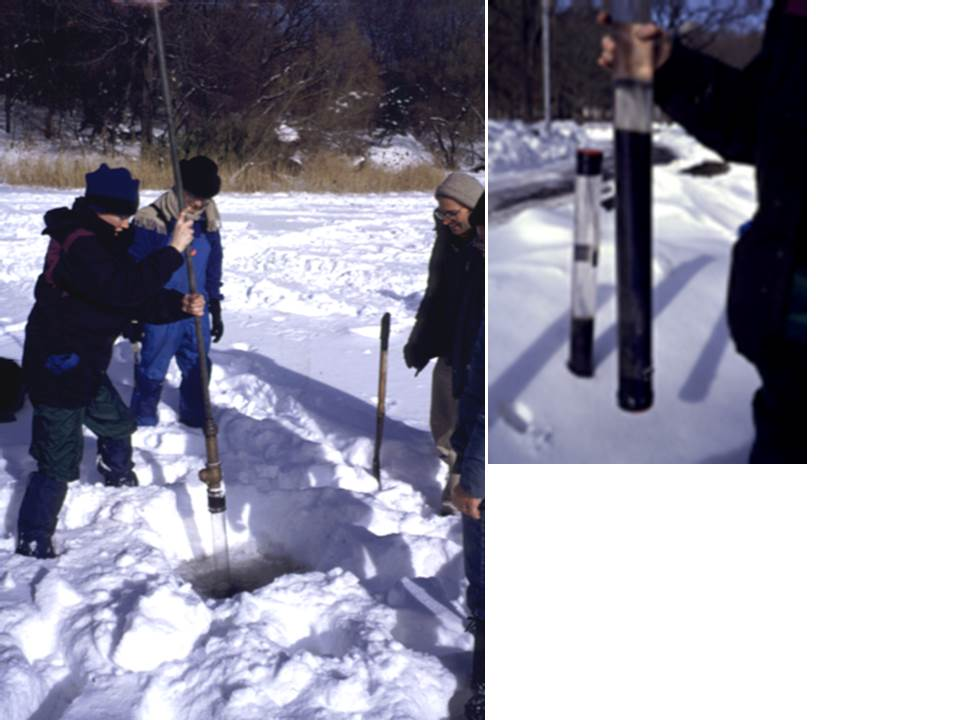

In [5]:
Image(filename='central_park_core.jpg',width=600)

We want to think about the results from Chillrud et al., and use them to develop questions and hypotheses about other sediment cores.

We collected a sediment core from the Hudson River Just North of the GW Bridge.  

Your goal is to 

1.  read the Chillrud paper.  
1.  Determine their main conclusions and hypothesis. 
1.  Develop your own hypothesis to test on the Hudson River Core
1.  Test that hypothesis with the sediment data from the Hudson River. 
1.  Report your findings (This is going to include multiple graphs) and writing in markdown


### This is the Research Vessel R/V Seawolf from Stony Brook used to collect a sediment core.  

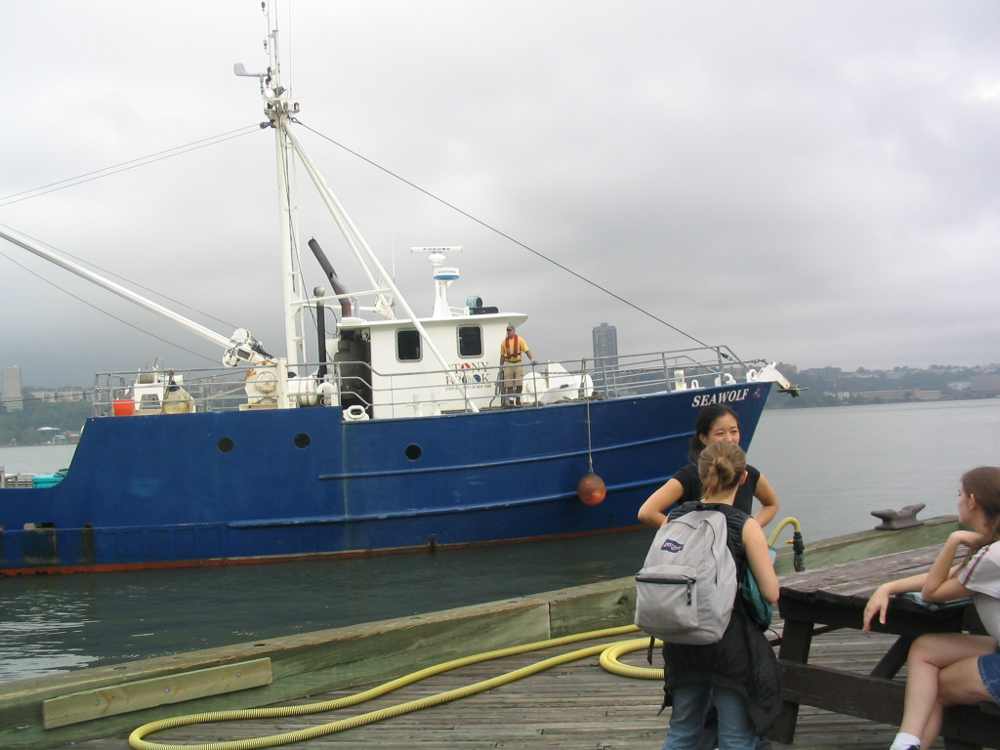

In [11]:
Image(filename='Seawolf.jpg',width=400)

### Here is an empty core liner getting ready for collection on the R/V Seawolf. It is a gravity corer.  
can you see the George Washington Bridge in the backgound?

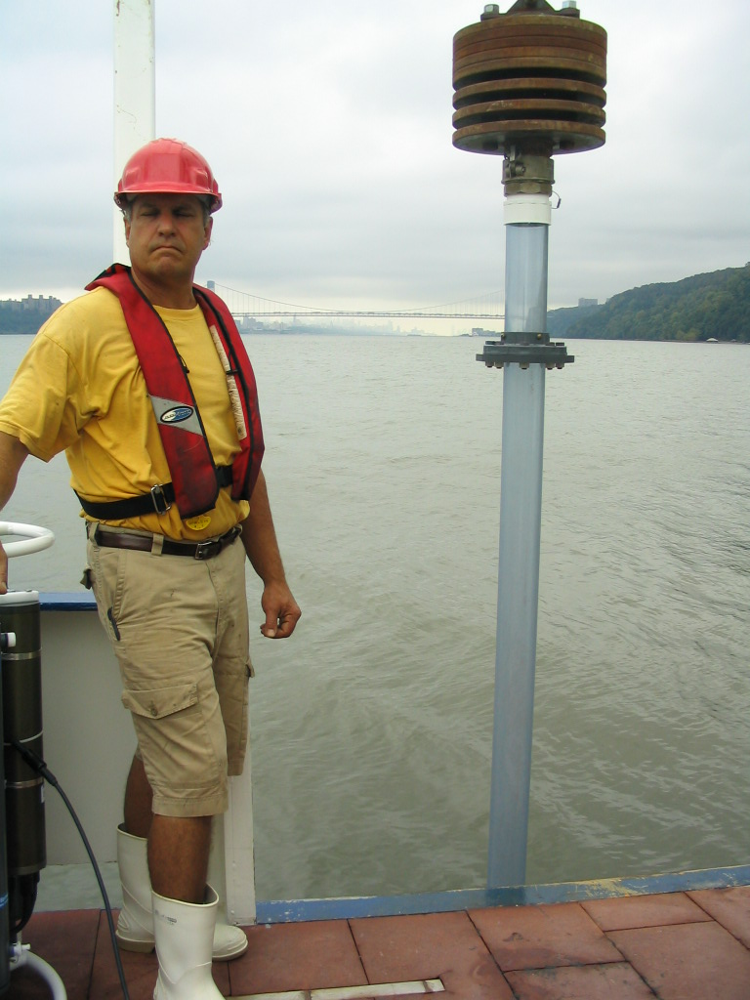

In [12]:
Image(filename='127_2800.jpg',width=300)

### Here is a full core liner that we are getting ready to put a cap onto.  

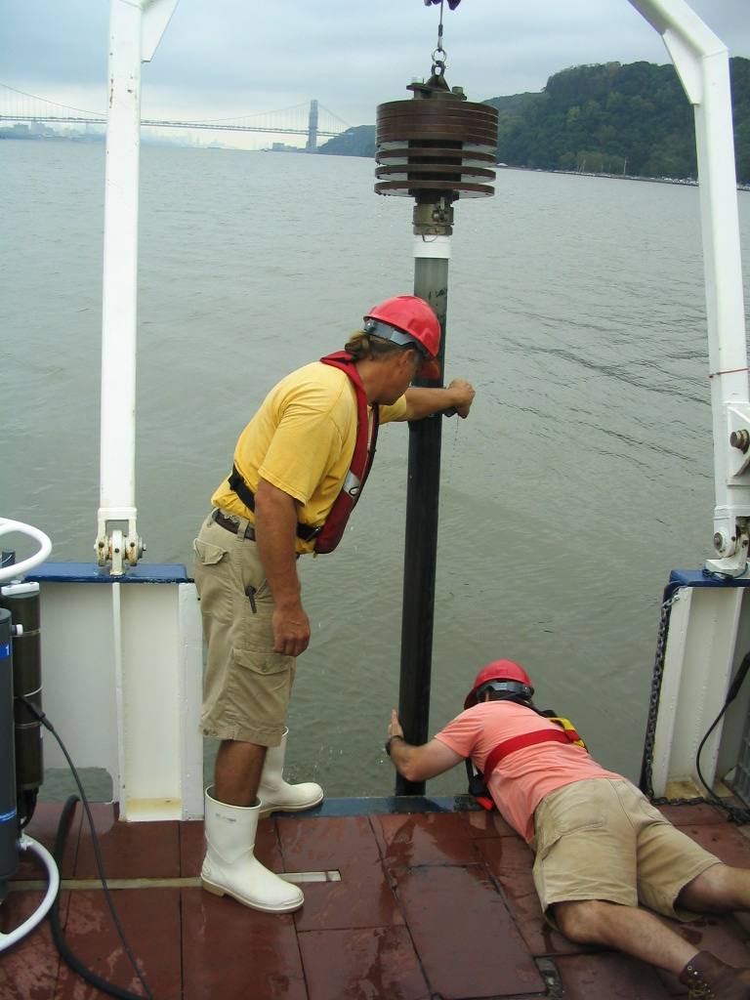

In [13]:
Image(filename='128_2801.jpg',width=300)

### This is the core split and photographed

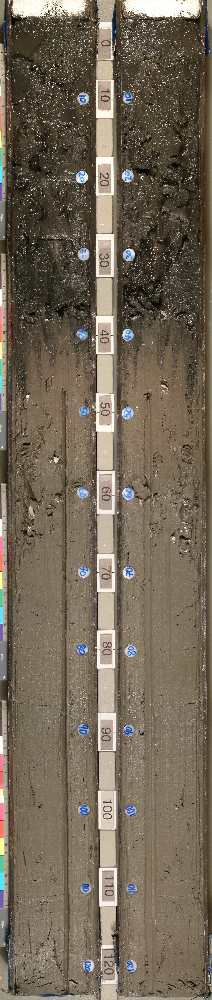

In [8]:
Image(filename='EM09-GC-01_comp.jpg',width=150)

As you go down in a core the sediment gets older.  The Hudson is similar to Lakes in many ways in that you can get regular sediment deposition. This way you can almost think about layers.  In this core we have a disontinuity around 40cm depth.  That may impact your interpretation.  Now i am using python to plot the location where we collected the core. I will teach you mapping in a few weeks...




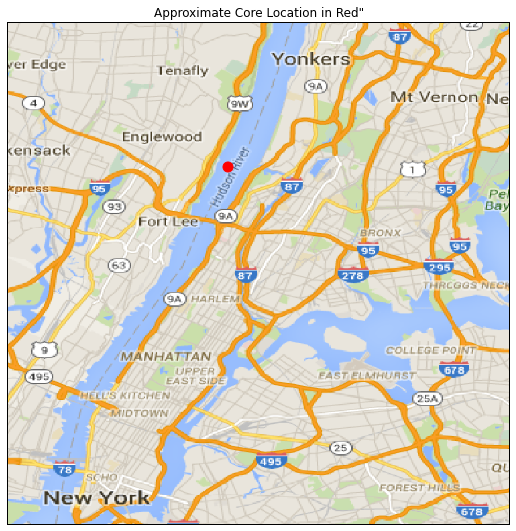

In [10]:
import cartopy.crs as ccrs
from cartopy.io.img_tiles import GoogleTiles
from cartopy.io.img_tiles import OSM
import cartopy.feature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

plt.figure(figsize=(10, 9))

ll_lat=40.7
ll_long=-74.05
ur_lat=40.95
ur_long=-73.8

# Use the tile's projection for the underlying map.
ax = plt.axes(projection=ccrs.PlateCarree())

# Specify a region of interest
ax.set_extent([ll_long, ur_long, ll_lat, ur_lat],    
              ccrs.PlateCarree())                     # this is x1,x2, y1,y2

gg_tiles = GoogleTiles(style='street') #we can change the style of teh figure from 'streets' to 'terrain' to 'satellite'
ax.add_image(gg_tiles, 11,alpha=1)   #the number is the zoom level and the alpha is if it is transparent

ax.scatter(-73.94,40.87766667, color='red', s=100, transform=ccrs.PlateCarree())
ax.set_title('Approximate Core Location in Red"')

## Lead
In order to understand the data you need to understand a little bit about lead isotopes.  We are using total lead and lead isotopes in two ways in this study and in this paper.  Lead-210 is a natural radionuclide of lead and has a half life of 22 years.  Lead is deposited at basically a constant rate from the atmosphere.  But once sediment is buried it can't get anymore Lead-210.  So the lead-210 decays and after 22 years you will have half as much as when you started. So by measuring lead-210 you can get an idea of the time since depositions!  That is how we have dates on the core. The lead-210 used for dating is also called Excess Lead-210.  But at the same time there is total Lead in the atmosphere.  This is all the stable and unstable isotopes of lead.  The amount of this total lead has changed in the atmosphere over time and we are interested in its temporal patterns and its controls.  So Lead-210 is helping with dating the sediment and total lead is telling us about atmospheric contamination.  Also, within these cores there is deposition of Cs-137 from nuclear fallout.  Also, there are other elements and metals that may have a contamination source while many elements are just natural.  Can we figure out which are natural and which correlate with the different sources of contamination?    